# LABORATORIO 3 - RUIDO Y SUAVIZADO 

Conocer cómo agregar ruido de diferentes tipos a una imagen

* Ruido Sal y Pimienta      

Está formado por puntos blancos y/o negros que se distribuyen de manera aleatoria
por la imagen, este tipo de ruido es independiente de la señal. Es un ruido que
aparece muchas veces producido por interferencias atmosféricas, o por acciones
hechas por el humano.

Ejercicio 3.1

In [3]:
import cv2
import numpy as np
from skimage.util import random_noise
# Load the image
img = cv2.imread("../0.data/Images/lenna.png")

In [7]:
# agregar diferentes tiposmde ruido a la imagen
noise_img = random_noise(img, mode='gaussian', clip=True)
noise_img = np.array(255*noise_img, dtype = 'uint8')
cv2.imshow('gaussian noise',noise_img)

noise_img = random_noise(img, mode='salt', amount=0.005)
noise_img = np.array(255*noise_img, dtype = 'uint8')
cv2.imshow('salt noise',noise_img)

noise_img = random_noise(img, mode='pepper', amount=0.005)
noise_img = np.array(255*noise_img, dtype = 'uint8')
cv2.imshow('pepper noise',noise_img)

noise_img = random_noise(img, mode='speckle', var=0.02, clip=True)
noise_img = np.array(255*noise_img, dtype = 'uint8')
cv2.imshow('speckle noise',noise_img)

noise_img=random_noise(img, mode='poisson', seed=1)
noise_img = np.array(255*noise_img, dtype = 'uint8')
cv2.imshow('poisson noise',noise_img)

noise_img = random_noise(img, mode='s&p',amount=0.3)
noise_img = np.array(255*noise_img, dtype = 'uint8')
cv2.imshow('s&p noise',noise_img)

#Las funciones anteriores devuelven una imagen de punto flotante
#en el rango de [0,1], los cambiamos a 'uint8'
#y de [0,255]
#noise_img = np.array(255*noise_img, dtype = 'uint8')

# mostrar el ruido en la imagen
#cv2.imshow('ruidos',noise_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

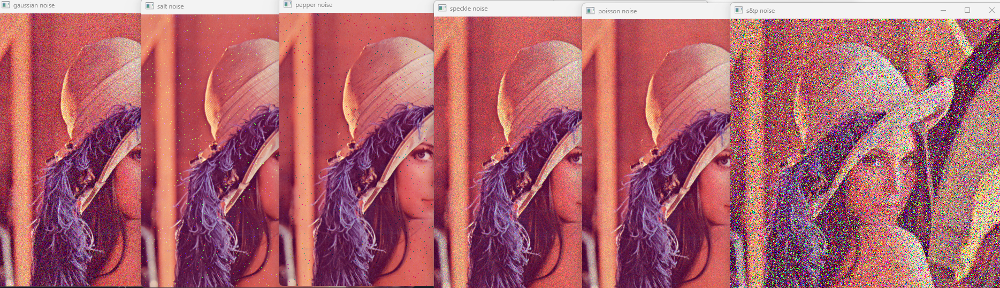

Ejercicio 3.2

- Filtrado de imágenes
- Suavizado (Smoothing)
- Filtro de promediado

In [8]:
import cv2
import numpy as np

# cargar las imágenes
img1 = cv2.imread("../0.data/Images/manzanas.jpg")
img2 = cv2.imread("../0.data/Images/lenna.png")
# cv2.imshow("ima1",img1)
# cv2.imshow("ima2",img2)

# Realización de difuminado promedio de la primera imagen
# Filters - left (3,3), middle(5,5), right(9,9)
blurred_1 = np.hstack([
                        cv2.blur(img1,(3,3)),
                        cv2.blur(img1,(5,5)),
                        cv2.blur(img1,(9,9))])
cv2.imshow("blurred",blurred_1)

# Realización de difuminado promedio de la segunda imagen
# Filters - left (3,3), middle(5,5), right(9,9)
blurred_2 = np.hstack([
                        cv2.blur(img2,(3,3)),
                        cv2.blur(img2,(5,5)),
                        cv2.blur(img2,(9,9))])
cv2.imshow("blurred2",blurred_2)

cv2.waitKey(0)
cv2.destroyAllWindows()

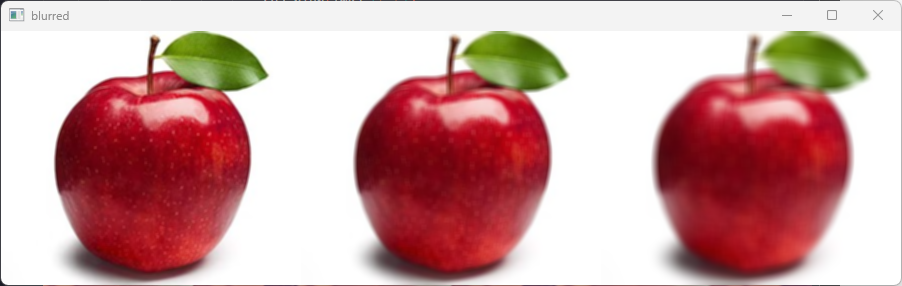

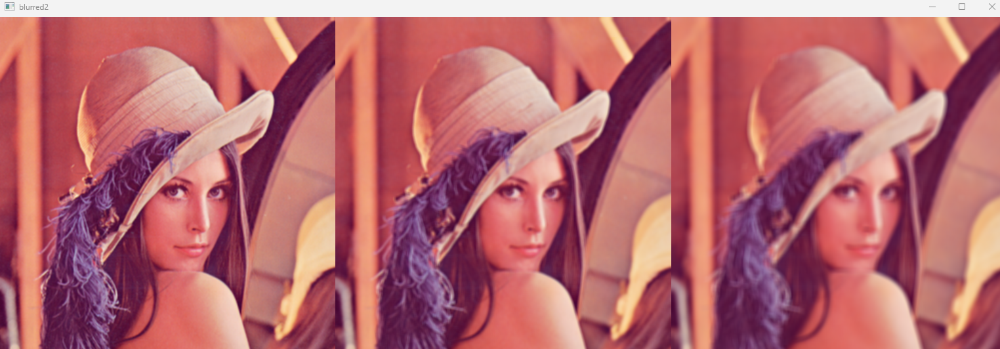

Filtro gaussiano

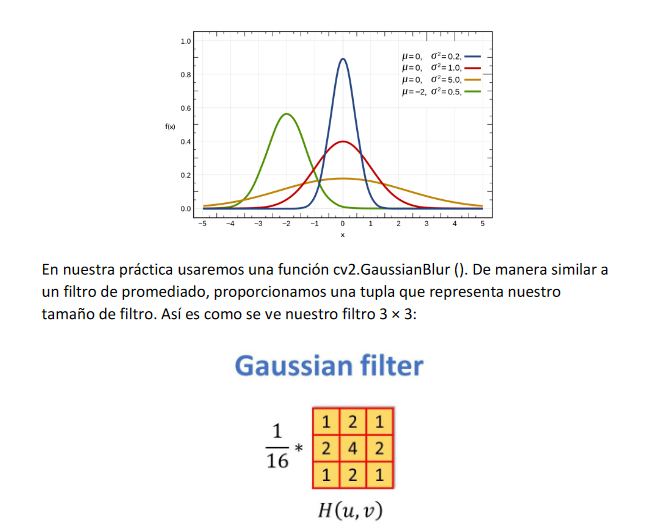

Enfocar una imagen

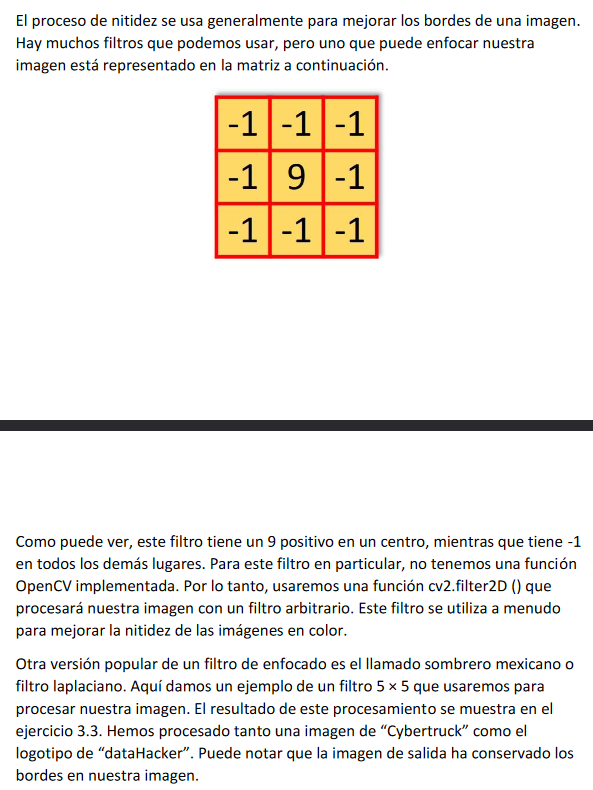

In [9]:
import cv2
import numpy as np
# cargar las imágenes
img1 = cv2.imread("../0.data/Images/apple.jpg",1)
img2 = cv2.imread("../0.data/Images/lenna.png",1)

# Creando un filtro de enfoque 1
filter = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

# Aplicando la función cv2.filter2D en la imagen
sharpen_img_1=cv2.filter2D(img1,-1,filter)
cv2.imshow("apple original",img1)
cv2.imshow("apple enfocado",sharpen_img_1)

# Creating our sharpening filter 2
filter = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

# Applying cv2.filter2D function on our Logo image
sharpen_img_2=cv2.filter2D(img2,-1,filter)
cv2.imshow("lena original",img2)
cv2.imshow("lena enfocado",sharpen_img_2)
cv2.waitKey(0)
cv2.destroyAllWindows()

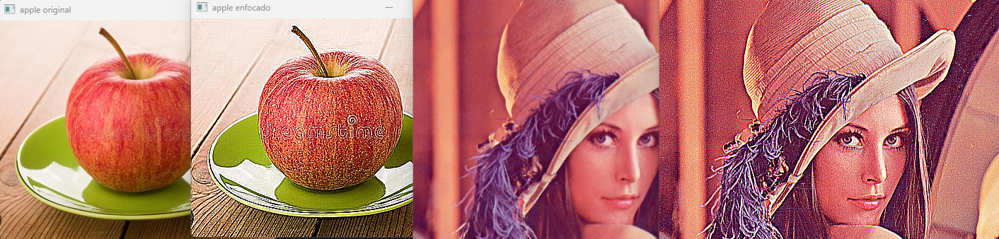

Ejercicio 3.4.

In [10]:
import cv2
import numpy as np
# cargar las imágenes
img1 = cv2.imread("../0.data/Images/apple.jpg",1)
img2 = cv2.imread("../0.data/Images/lenna.png",1)

# Creando el filtro de sombrero mexicano
filter = np.array([[0,0,-1,0,0],[0,-1,-2,-1,0],[-1,-2,16,-2,-1],[0,-
1,-2,-1,0],[0,0,-1,0,0]])
# Aplicando la función cv2.filter2D
mexican_hat_img1=cv2.filter2D(img1,-1,filter)
cv2.imshow("apple con filtro",mexican_hat_img1)


# Creando el filtro de sombrero mexicano
filter = np.array([[0,0,-1,0,0],[0,-1,-2,-1,0],[-1,-2,16,-2,-1],[0,-
1,-2,-1,0],[0,0,-1,0,0]])
# Aplicando la función cv2.filter2D
mexican_hat_img2=cv2.filter2D(img2,-1,filter)
cv2.imshow("lena con filtro",mexican_hat_img2)

cv2.waitKey(0)
cv2.destroyAllWindows()

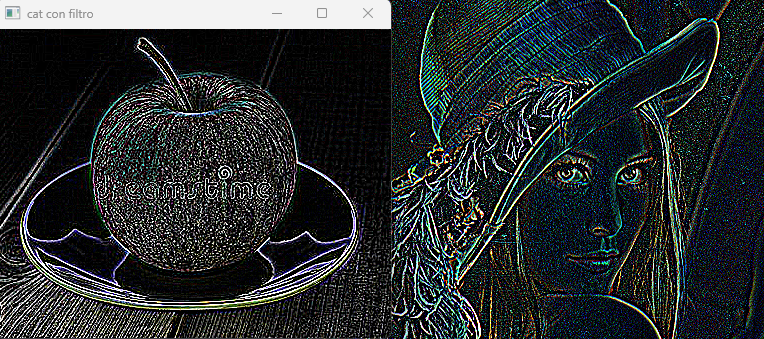

Implementar el algoritmo SUSAN (Smallest Univalue Segment Assimilating
Nucleus) para eliminación de ruido en las imágenes.

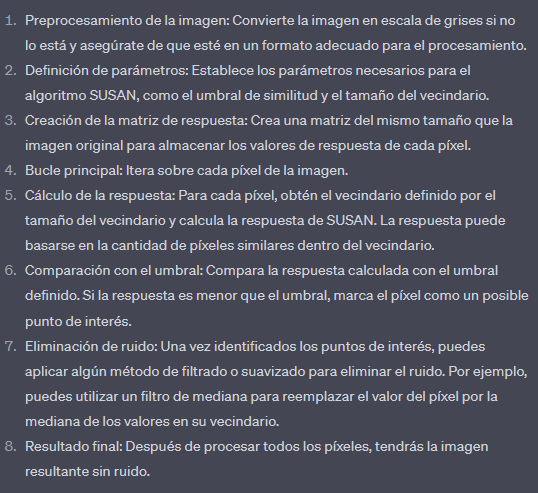

In [1]:
import cv2
import numpy as np

def susan_noise_removal(image, threshold, neighborhood_size):
    height, width = image.shape[:2]
    response = np.zeros((height, width), dtype=np.uint8)

    for y in range(height):
        for x in range(width):
            neighborhood = image[max(0, y-neighborhood_size):min(height, y+neighborhood_size+1),
                                 max(0, x-neighborhood_size):min(width, x+neighborhood_size+1)]

            similarity = np.abs(neighborhood.astype(np.int32) - image[y, x])
            response[y, x] = np.sum(similarity <= threshold)

    noise_points = response < threshold
    denoised_image = cv2.medianBlur(image, 3)  # Aplicar un filtro de mediana para eliminar el ruido

    denoised_image[noise_points] = image[noise_points]  # Reemplazar los puntos de interés con los valores originales

    return denoised_image


# Cargar la imagen
image = cv2.imread('../0.data/Images/puente_con_ruido.jpg', 1)  # Asegúrate de tener una imagen "imagen_ruidosa.jpg" en el directorio


# Eliminar el ruido utilizando el algoritmo SUSAN
threshold = 5
neighborhood_size = 12
denoised_image = susan_noise_removal(image, threshold, neighborhood_size)


# Mostrar la imagen original y la imagen denoised
cv2.imshow('Imagen Original', image)
cv2.imshow('Imagen Denoised', denoised_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

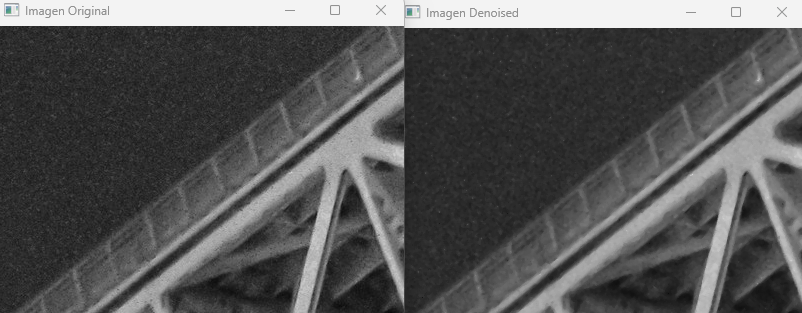

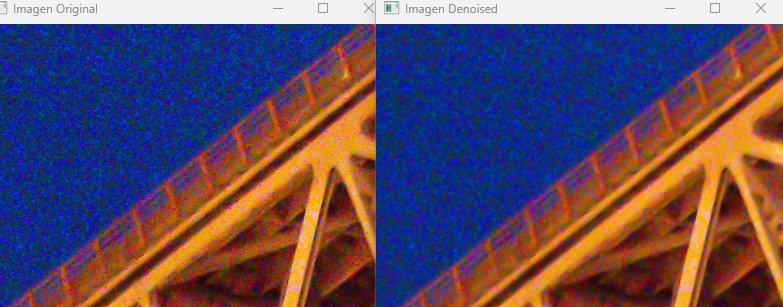

In [8]:
import cv2
import numpy as np

def susan_noise_removal(image, threshold, neighborhood_size):
    height, width = image.shape[:2]
    denoised_image = np.zeros((height, width), dtype=np.uint8)

    for y in range(neighborhood_size, height - neighborhood_size):
        for x in range(neighborhood_size, width - neighborhood_size):
            center_pixel = image[y, x]
            neighborhood = image[y - neighborhood_size:y + neighborhood_size + 1,
                                 x - neighborhood_size:x + neighborhood_size + 1]
            similarity = np.abs(neighborhood - center_pixel)
            count = np.sum(similarity <= threshold)

            if count <= neighborhood_size * neighborhood_size * 0.5:
                denoised_image[y, x] = center_pixel
            else:
                denoised_image[y, x] = np.mean(neighborhood)

    return denoised_image

# Cargar la imagen
image = cv2.imread('../0.data/Images/puente_con_ruido.jpg', 0)  # Asegúrate de tener una imagen "imagen_ruidosa.jpg" en el directorio

# Eliminar el ruido utilizando el algoritmo SUSAN
threshold = 15
neighborhood_size = 15
denoised_image = susan_noise_removal(image, threshold, neighborhood_size)

# Mostrar la imagen original y la imagen denoised
cv2.imshow('Imagen Original', image)
cv2.imshow('Imagen Denoised', denoised_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


neighborhood_size = 3

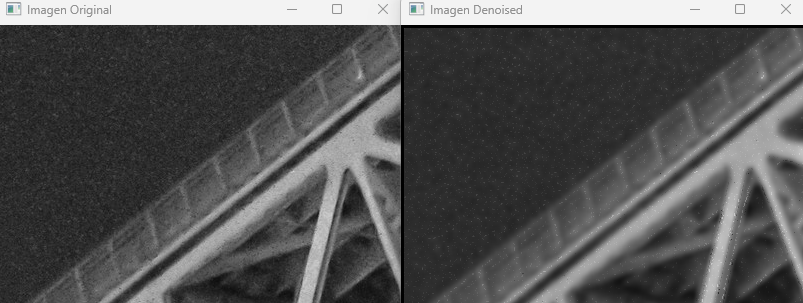

neighborhood_size = 9

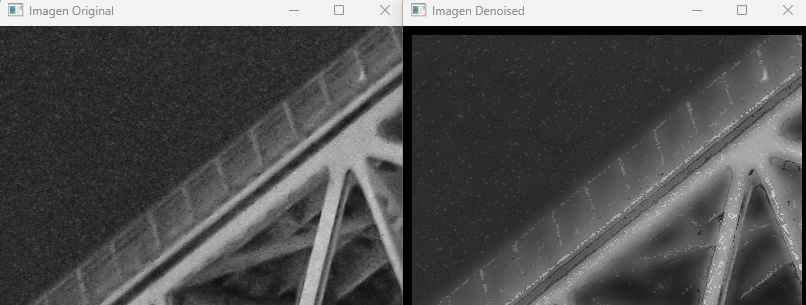

# LABORATORIO 4 - HISTOGRAMAS

- Obtener el histograma de una imagen en escala de grises o a color.
- Conocer la utilidad del histograma de una imagen.

**Ejercicio 4.1. En este ejercicio, leemos una imagen en escala de grises, mostrandola y
luego trazando su histograma 2D con 256 bins.**

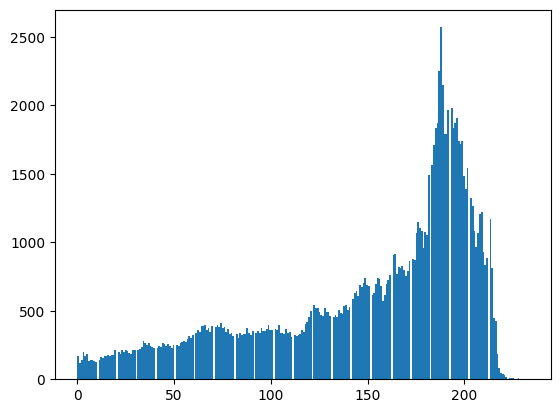

In [9]:
import cv2
import matplotlib.pyplot as plt
#--leer la imagen
img= cv2.imread('../0.data/Images/ave_colorida.jpg', cv2.IMREAD_GRAYSCALE)
cv2.imshow('grayscale image', img)

#--calcular histograma y mostrar
#--El eje X del histograma de la imagen tendrá un rango de 0-255
#--y el eje Y rastrea el recuento de píxeles contra cada intensidad.
ax = plt.hist(img.ravel(), bins = 256)
plt.show()

#--esperar
cv2.waitKey(0)
cv2.destroyAllWindows()

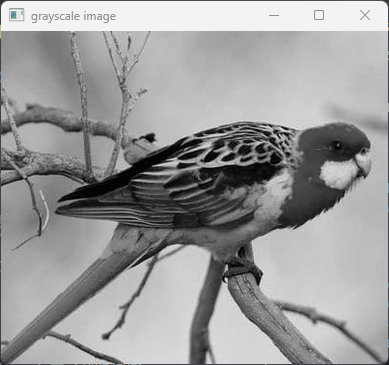

Ejercicio 4.2. Trazar una imagen de muestra y su histograma con 10 bins

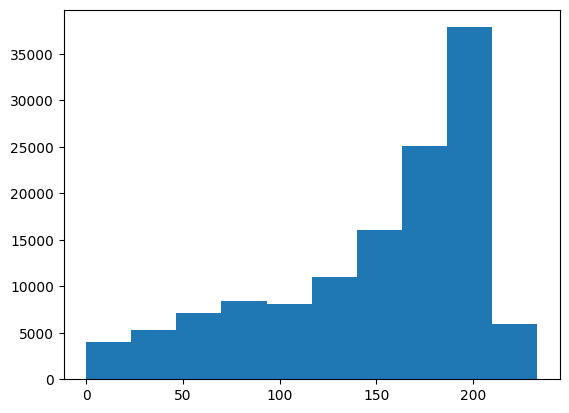

In [10]:
import cv2
import matplotlib.pyplot as plt

#--leer la imagen
img= cv2.imread("../0.data/Images/ave_colorida.jpg",cv2.IMREAD_GRAYSCALE)
cv2.imshow('grayscale image', img)

#--calcular el histograma, por defecto 10 bins
plt.hist(img.ravel())
plt.show()

#--esperar
cv2.waitKey(0)
cv2.destroyAllWindows()

**Ejercicio 4.3. Histograma de una imagen a color.**        
Para trazar los tres histogramas 2D de los tres canales (B, G y R) en un solo trazado
pero en diferentes colores, se puede llamar al comando plt.show () después de usar el
comando plt.hist () en cada canal individual . Se usa un valor de transparencia de 0.5
para mostrar los tres canales en sus respectivos colores en el gráfico del histograma:

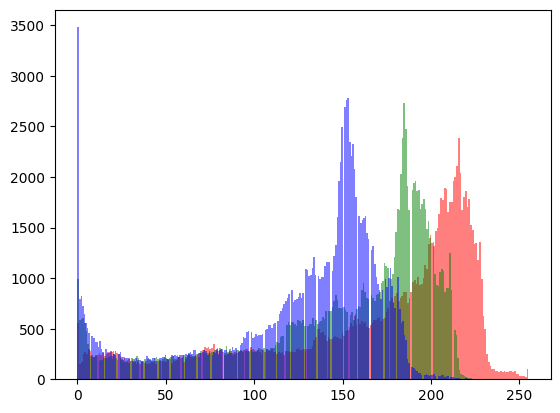

In [11]:
import cv2
import matplotlib.pyplot as plt
#--leer la imagen
img= cv2.imread('../0.data/Images/ave_colorida.jpg')
cv2.imshow("color image",img)

im= img[:, :, 2]
plt.hist(im.ravel(), bins = 256, color = 'Red', alpha = 0.5)
im= img[:, :, 1]
plt.hist(im.ravel(), bins = 256, color = 'Green', alpha = 0.5)
im= img[:, :, 0]
plt.hist(im.ravel(), bins = 256, color = 'Blue', alpha = 0.5)
plt.show()

#--esperar
cv2.waitKey(0)
cv2.destroyAllWindows()

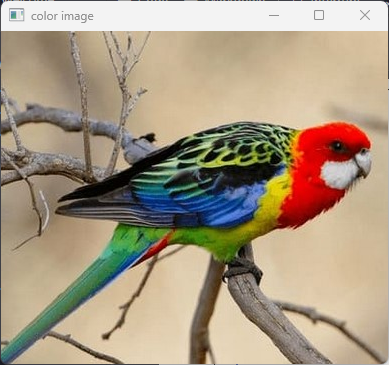

**ACTIVIDAD II. HISTOGRAMAS CON OpenCV.**

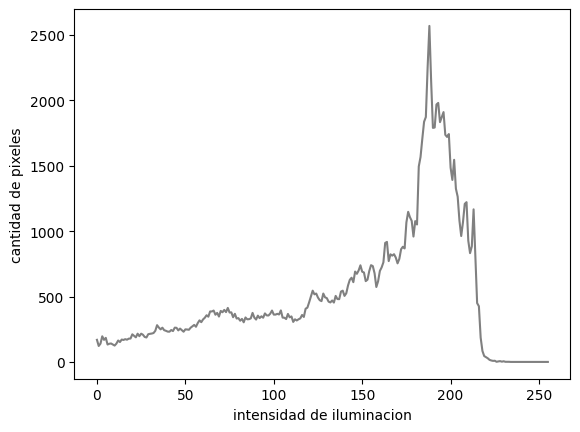

In [13]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
#--leer la imagen
img = cv2.imread('../0.data/Images/ave_colorida.jpg',cv2.IMREAD_GRAYSCALE)
cv2.imshow('lena.jpg', img)

#--determinar el histograma
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

#--plotear el histograma
plt.plot(hist, color='gray' )
plt.xlabel('intensidad de iluminacion')
plt.ylabel('cantidad de pixeles')
plt.show()

#--esperar
cv2.waitKey(0)
cv2.destroyAllWindows()

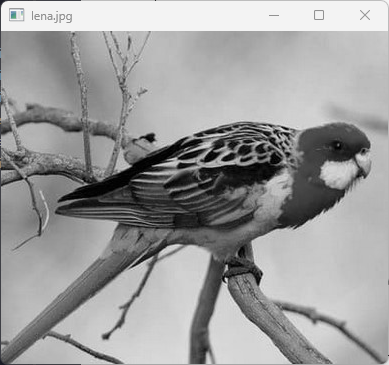

**Ejercicio 4.5. Histograma de una imagen a color.**

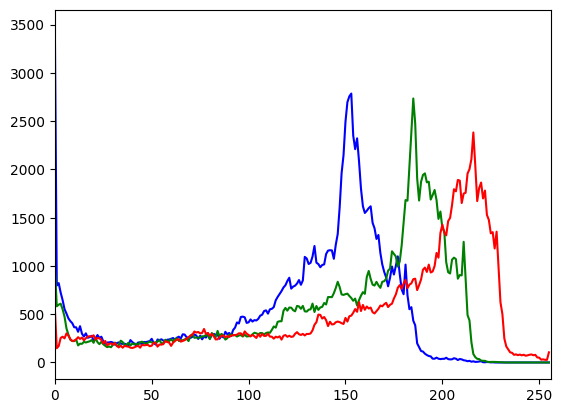

In [2]:

import cv2
import numpy as np
from matplotlib import pyplot as plt

#--leer la imagen
img = cv2.imread('../0.data/Images/ave_colorida.jpg')
cv2.imshow('lena.jpg', img)
color = ('b','g','r')

#--calcular el histograma
for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

#--esperar
cv2.waitKey(0)
cv2.destroyAllWindows()

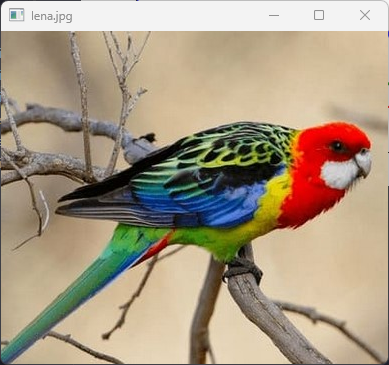

**Ejercicio 4.6. Histograma con máscara.A**

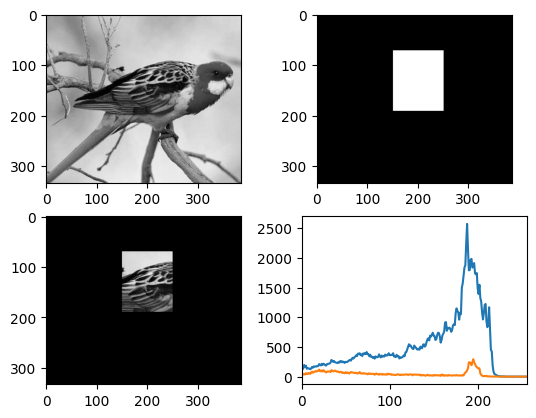

In [4]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)
# crear máscara
mask = np.zeros(img.shape[:2], np.uint8)
mask[70:190, 150:250] = 255

masked_img = cv2.bitwise_and(img,img,mask = mask)

# Calcular el histograma con máscara y sin máscara
hist_full = cv2.calcHist([img],[0],None,[256],[0,256])
hist_mask = cv2.calcHist([img],[0],mask,[256],[0,256])

plt.subplot(221), plt.imshow(img, 'gray')
plt.subplot(222), plt.imshow(mask,'gray')
plt.subplot(223), plt.imshow(masked_img, 'gray')
plt.subplot(224), plt.plot(hist_full), plt.plot(hist_mask)
plt.xlim([0,256])
plt.show()

**4. ACTIVIDAD III. ECUALIZACION DE UN HISTOGRAMA**

En este ejercicio, leemos una imagen en escala de grises, trazándola y luego se traza su
histograma 2D con 256 bins. Después de eso, le aplicaremos la ecualización de
histograma y luego trazaremos el histograma de la imagen ecualizada.

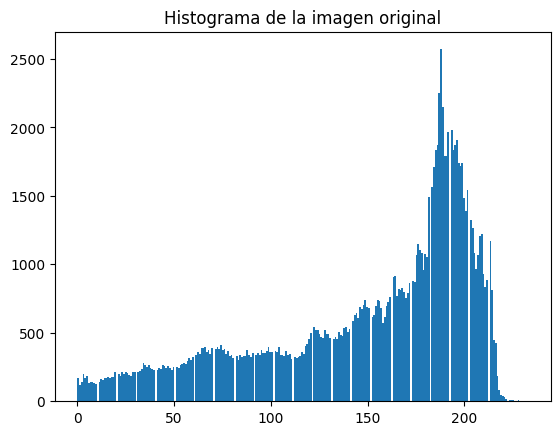

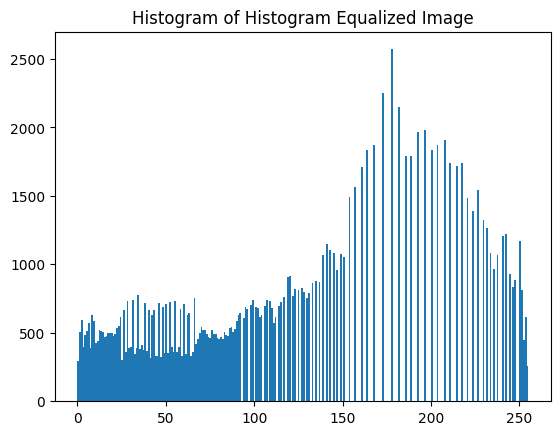

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
#--leer la imagen
img= cv2.imread('../0.data/Images/ave_colorida.jpg', 0)
cv2.imshow('Imagen original', img)

#--obtener el histograma de la imagen original
ax = plt.hist(img.ravel(), bins= 256)
plt.title('Histograma de la imagen original')
plt.show()

#--aplicando la ecualización
histequ = cv2.equalizeHist(img)
#--muestra la imagen ecualizada
cv2.imshow('Histograma de la imagen ecualizada', histequ)

#--obtiene el histograma de la imagen ecualizada
ax = plt.hist(histequ.ravel(), bins= 256)
plt.title('Histogram of Histogram Equalized Image')
plt.show()

img_with_histequ = np.hstack((img,histequ))
cv2.imshow('Comparison', img_with_histequ)

cv2.waitKey(0)
cv2.destroyAllWindows()

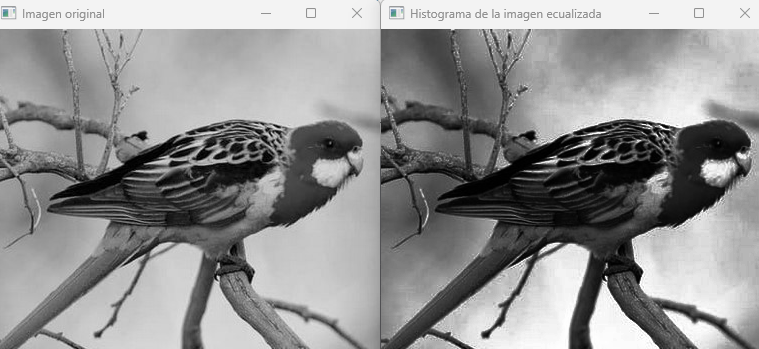

# LABORATORIO 5 - IMÁGENES BINARIAS

- Conocer la umbralización simple, la umbralización adaptativa y la umbralización de Otsu.
- Conocer las operaciones morfológicas de erosión, dilatación, apertura y cierre

**ACTIVIDAD I. UMBRALIZACIÓN SIMPLE**

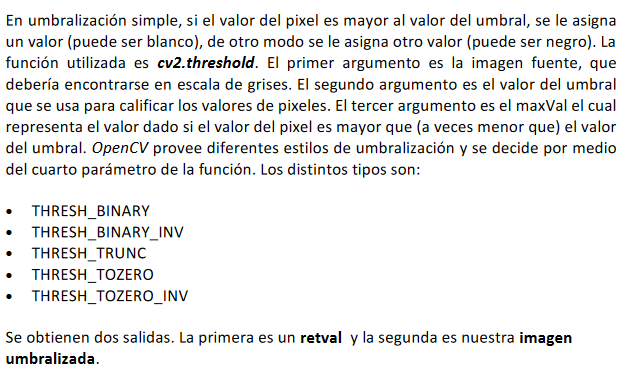

**Ejercicio 5.1. En este ejercicio, leemos una imagen en escala de grises y luego l
mostramos umbralizada en distintos tipos.**

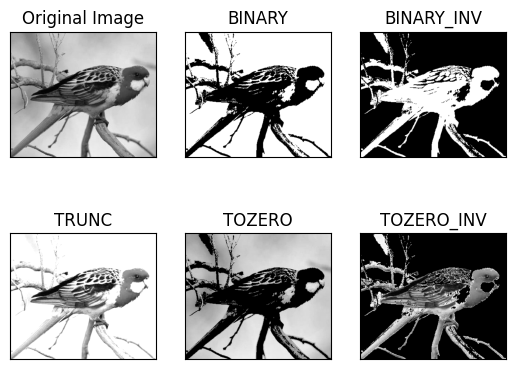

In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)

ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
miArray = np.arange(6)

for i in miArray:
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

**ACTIVIDAD II. UMBRALIZACIÓN ADAPTATIVA**

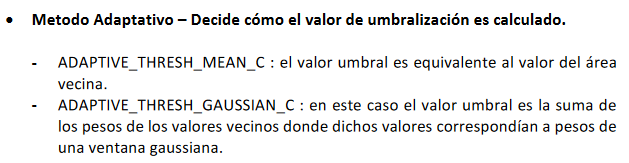

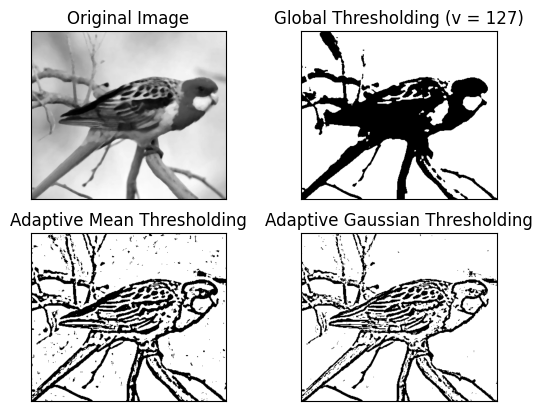

In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)

img = cv2.medianBlur(img,5)

ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,
                                    cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                    cv2.THRESH_BINARY,11,2)

titles = ['Original Image', 'Global Thresholding (v = 127)','Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
miArray = np.arange(4)

for i in miArray:
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

**ACTIVIDAD III. LA BINARIZACION DE OTSU**

Para esto, usamos la función cv2.threshold(), pero con un indicador adicional,
cv2.THRESH_OTSU. Para el valor umbral, sólo usamos cero. Luego el algoritmo
encuentra el valor umbral óptimo y lo regresa como la segunda salida, retVal. Si la
umbralización de Otsu no se usa, retVal es igual al valor de umbral que se use.

En el ejercicio siguiente, la imagen de entrada posee mucho ruido. En el primer caso,
aplicamos la umbralización global para un valor de 127. En el segundo caso, aplicamos
la umbralización de Otsu de forma directa. En el tercer caso, filtramos la imagen con
kernel gaussiano 5×5 para remover el ruido, luego aplicamos la umbralización de Otsu.
Observa como el filtro que remueve el ruido mejora los resultados.

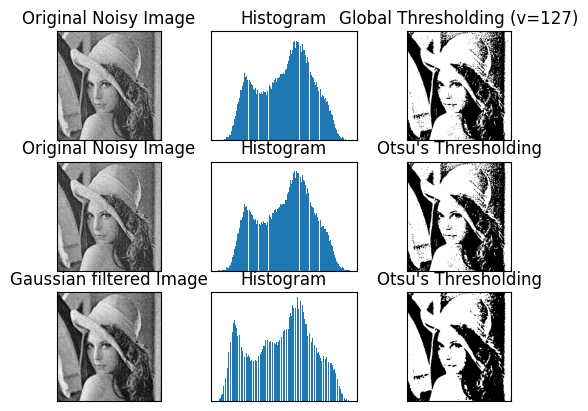

In [10]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
img = cv2.imread('../0.data/Images/lena_noisy.jpg',0)

# umbral global
ret1,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
# umbral de Otsu
ret2,th2 = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
# umbral de Otsu después del filtro Gaussiano
blur = cv2.GaussianBlur(img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# plotear las imagenes y sus histogramas
images = [img, 0, th1, img, 0, th2, blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]
miArray = np.arange(3)
for i in miArray:
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

**5. ACTIVIDAD IV. OPERACIONES MORFOLÓGICAS**

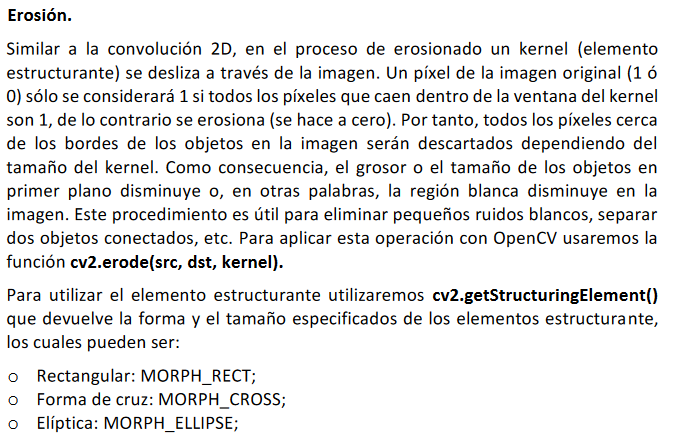

In [11]:
import cv2
import numpy as np
#--leer la imagen
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)
#--elemento estructurante
kernel = np.ones((7,7),np.uint8)
#kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (7,7))
#kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
#kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
#--realizar la erosion
erosion = cv2.erode(img,kernel,iterations = 1)
#--mostrar resultados
cv2.imshow("original", img)
cv2.imshow("erosion", erosion)

cv2.waitKey(0)
cv2.destroyAllWindows()

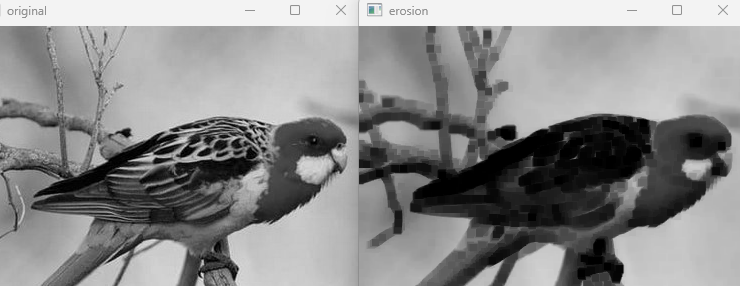

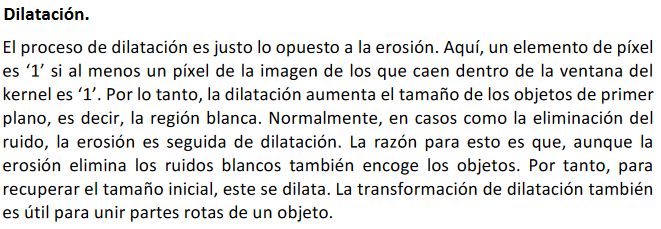

In [14]:
import cv2
import numpy as np
#--leer la imagen
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)
cv2.imshow("original", img)

#--elemento estructurante
kernel = np.ones((7,7),np.uint8)
dilatacion = cv2.dilate(img,kernel,iterations = 1)
#--mostrar resultados
cv2.imshow("dilatacion kernel (7,7)", dilatacion)


kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (7,7))
dilatacion = cv2.dilate(img,kernel,iterations = 1)
#--mostrar resultados
cv2.imshow("dilatacion MORPH_CROSS, (7,7)", dilatacion)


kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
dilatacion = cv2.dilate(img,kernel,iterations = 1)
#--mostrar resultados
cv2.imshow("dilatacion MORPH_RECT, (5, 5)", dilatacion)


kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
dilatacion = cv2.dilate(img,kernel,iterations = 1)
#--mostrar resultados
cv2.imshow("dilatacion MORPH_ELLIPSE,(3,3)", dilatacion)

#--realizar la erosion
#erosion = cv2.erode(img,kernel,iterations = 1)
#dilatacion = cv2.dilate(img,kernel,iterations = 1)

cv2.waitKey(0)
cv2.destroyAllWindows()

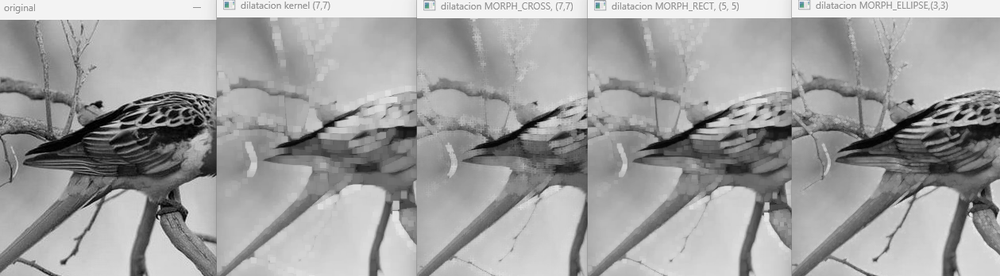

Apertura.
La apertura es simplemente otro nombre para erosión seguida de dilatación. Como
se explicó anteriormente, es útil para eliminar el ruido. En este caso se utiliza la
función, cv2.morphologyEx().

In [15]:
import cv2
import numpy as np

#--leer la imagen
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)
cv2.imshow("original", img)

#--elemento estructurante
kernel = np.ones((7,7),np.uint8)
#--realizar la erosion
apertura = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
cv2.imshow("(7,7) erosion + dilatacion = apertura", apertura)


kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (7,7))
#--realizar la erosion
apertura = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
cv2.imshow("MORPH_CROSS(7,7) erosion + dilatacion", apertura)


kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
#--realizar la erosion
apertura = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
cv2.imshow("MORPH_RECT(5, 5) erosion + dilatacion", apertura)


kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
#--realizar la erosion
apertura = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
cv2.imshow("MORPH_ELLIPSE(3,3) erosion + dilatacion", apertura)


cv2.waitKey(0)
cv2.destroyAllWindows()

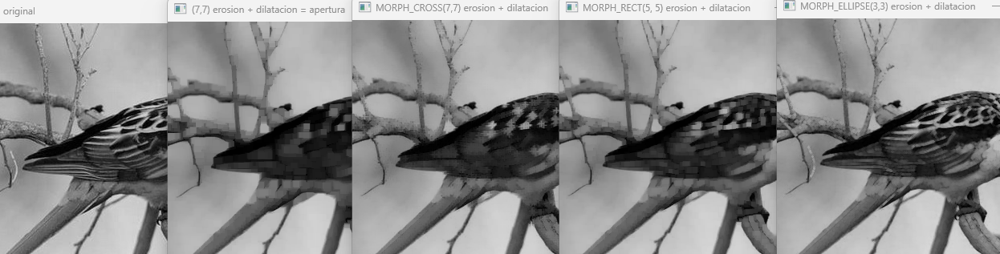

Cierre


El cierre es el opuesto de apertura, es decir, dilatación seguida de erosión. Es útil
para cerrar pequeños agujeros dentro de los objetos de primer plano, o pequeños
puntos negros en el objeto.

In [19]:
import cv2
import numpy as np
#--leer la imagen
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)
cv2.imshow("original", img)

#--elemento estructurante
kernel = np.ones((7,7),np.uint8)
#--realizar el cierre
cierre = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
cv2.imshow("erosion (7,7)", cierre)


kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (7,7))
#--realizar el cierre
cierre = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
cv2.imshow("erosion MORPH_CROSS" , cierre)


kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
#--realizar el cierre
cierre = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
cv2.imshow("erosion MORPH_RECT", cierre)


kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
#--realizar el cierre
cierre = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
cv2.imshow("erosion MORPH_ELLIPSE", cierre)


cv2.waitKey(0)
cv2.destroyAllWindows()

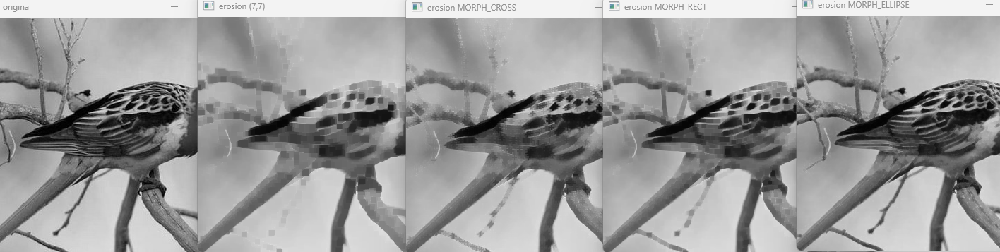

Gradiente Morfológico


Es la diferencia entre la dilatación y la erosión de una imagen. El resultado se verá como el contorno del objeto

In [23]:
import cv2
import numpy as np
#--leer la imagen
img = cv2.imread('../0.data/Images/ave_colorida.jpg',0)
cv2.imshow("original", img)
#--elemento estructurante
kernel = np.ones((7,7),np.uint8)
#--realizar el grqdiente
gradiente = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
cv2.imshow("erosion 1", gradiente)

kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (7,7))
#--realizar el grqdiente
gradiente = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
cv2.imshow("erosion 2", gradiente)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
#--realizar el grqdiente
gradiente = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
cv2.imshow("erosion 3", gradiente)

kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
#--realizar el grqdiente
gradiente = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
cv2.imshow("erosion 4", gradiente)


cv2.waitKey(0)
cv2.destroyAllWindows()

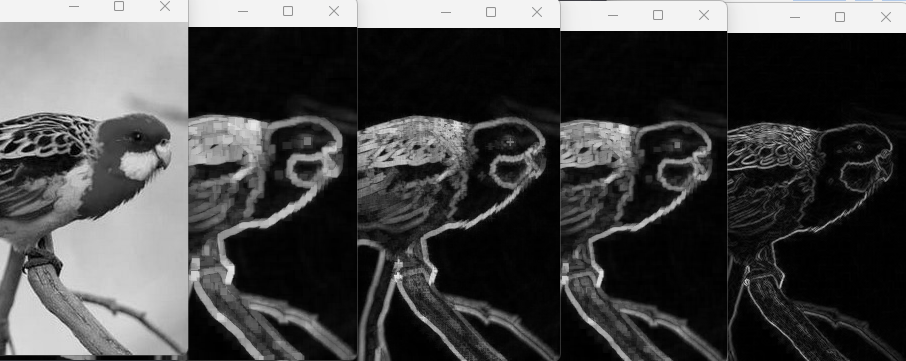

Encontrar las piezas de ajedrez que se han movido usando dos imágenes tomadas
de la misma partida.

In [28]:
import cv2
import numpy as np

def find_moved_chess_pieces(image1, image2):
    # Convertir las imágenes a escala de grises
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Calcular la diferencia absoluta entre las imágenes
    diff = cv2.absdiff(np.array(gray1), np.array(gray2))

    # Aplicar un umbral para resaltar las diferencias
    _, threshold = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    # Encontrar contornos en la imagen umbralizada
    contours, _ = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    moved_pieces = []

    # Iterar sobre los contornos y encontrar las piezas movidas
    for contour in contours:
        # Descartar los contornos pequeños
        if cv2.contourArea(contour) > 100:
            # Obtener el rectángulo delimitador del contorno
            x, y, w, h = cv2.boundingRect(contour)

            # Dibujar un rectángulo alrededor de la pieza movida en la segunda imagen
            cv2.rectangle(image2, (x, y), (x + w, y + h), (0, 255, 0), 2)

            # Agregar el rectángulo a la lista de piezas movidas
            moved_pieces.append((x, y, w, h))

    return image2, moved_pieces

# Cargar las dos imágenes de la partida
image1 = cv2.imread('../0.data/Images/tablero1.jpg')  # Asegúrate de tener las imágenes "imagen1.jpg" y "imagen2.jpg" en el directorio
image2 = cv2.imread('../0.data/Images/tablero2.jpg')

# Encontrar las piezas movidas en las imágenes
result_image, moved_pieces = find_moved_chess_pieces(image1, image2)

# Mostrar la imagen resultante con los rectángulos alrededor de las piezas movidas
cv2.imshow('Resultado', result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


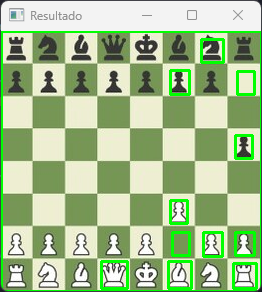

In [1]:
import cv2
import numpy as np

def find_moved_chess_pieces(image1, image2):
    # Convertir las imágenes a escala de grises
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Aplicar umbralización de Otsu para obtener una imagen binaria
    _, threshold1 = cv2.threshold(gray1, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    _, threshold2 = cv2.threshold(gray2, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Realizar una operación de resta entre las imágenes binarias
    diff = cv2.absdiff(threshold1, threshold2)

    # Encontrar contornos en la imagen de diferencia
    contours, _ = cv2.findContours(diff, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    moved_pieces = []

    # Iterar sobre los contornos y encontrar las piezas movidas
    for contour in contours:
        # Descartar los contornos pequeños
        if cv2.contourArea(contour) > 100:
            # Obtener el rectángulo delimitador del contorno
            x, y, w, h = cv2.boundingRect(contour)

            # Dibujar un rectángulo alrededor de la pieza movida en la segunda imagen
            cv2.rectangle(image2, (x, y), (x + w, y + h), (0, 255, 0), 2)

            # Agregar el rectángulo a la lista de piezas movidas
            moved_pieces.append((x, y, w, h))

    return image2, moved_pieces

# Cargar las dos imágenes de la partida
image1 = cv2.imread('../0.data/Images/tablero1.jpg')  # Asegúrate de tener las imágenes "imagen1.jpg" y "imagen2.jpg" en el directorio
image2 = cv2.imread('../0.data/Images/tablero2.jpg')

# Encontrar las piezas movidas en las imágenes
result_image, moved_pieces = find_moved_chess_pieces(image1, image2)

# Mostrar la imagen resultante con los rectángulos alrededor de las piezas movidas
cv2.imshow('Resultado', result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


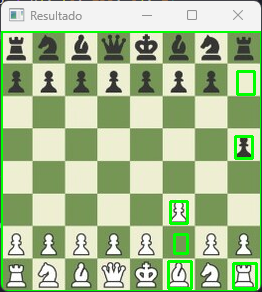

In [9]:
import cv2
import numpy as np

def find_moved_chess_pieces(image1, image2):
    # Convertir las imágenes a escala de grises
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Aplicar umbralización de Otsu para obtener una imagen binaria
    _, threshold1 = cv2.threshold(gray1, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    _, threshold2 = cv2.threshold(gray2, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Realizar una operación de resta entre las imágenes binarias
    diff = cv2.absdiff(threshold1, threshold2)

    # Crear una máscara para resaltar las diferencias
    mask = cv2.merge((diff, diff, diff))

    # Aplicar la máscara a la segunda imagen
    result_image = cv2.bitwise_and(image2, mask)

    # Encontrar contornos en la imagen de diferencia
    contours, _ = cv2.findContours(diff, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    moved_pieces = []

    # Iterar sobre los contornos y encontrar las piezas movidas
    for contour in contours:
        # Descartar los contornos pequeños
        if cv2.contourArea(contour) > 100:
            # Obtener el rectángulo delimitador del contorno
            x, y, w, h = cv2.boundingRect(contour)

            # Dibujar un rectángulo alrededor de la pieza movida en la segunda imagen
            cv2.rectangle(result_image, (x, y), (x + w, y + h), (0, 255, 0), 2)

            # Extraer la pieza movida en una imagen en blanco y negro
            moved_piece = gray2[y:y + h, x:x + w]

            # Agregar la imagen de la pieza movida a la lista
            moved_pieces.append(moved_piece)

    return result_image, moved_pieces

# Cargar las dos imágenes de la partida
image1 = cv2.imread('../0.data/Images/tablero1.jpg')  # Asegúrate de tener las imágenes "imagen1.jpg" y "imagen2.jpg" en el directorio
image2 = cv2.imread('../0.data/Images/tablero2.jpg')

# Encontrar las piezas movidas en las imágenes
result_image, moved_pieces = find_moved_chess_pieces(image1, image2)

# Mostrar la imagen resultante con los rectángulos alrededor de las piezas movidas
cv2.imshow('Resultado', result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# # Mostrar cada imagen de pieza movida en blanco y negro
# for i, piece in enumerate(moved_pieces):
#     cv2.imshow(f'Pieza Movida {i+1}', piece)

# cv2.waitKey(0)
# cv2.destroyAllWindows()


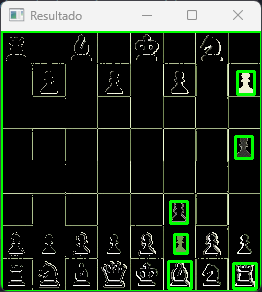